In [1]:
import astroviz as av
import numpy as np
from astropy import units as u

# Importing FITS files

FITS files can be read using the 'importfits' function or via the constructors of the 'PVdiagram', 'Spatialmap,' and 'Datacube' classes. Astroviz is capable of reading data up to three dimensions (PV Diagrams, Continuum Maps, Moment Maps, and Data Cubes). Here are some different ways of importing a FITS file:

In [2]:
# importing via 'importfits' function:
datacube = av.importfits("test_fitsfiles/datacube.fits")
continuum = av.importfits("test_fitsfiles/continuum.fits")
pv = av.importfits("test_fitsfiles/pvdiagram.fits")

In [3]:
# importing via constructors:
datacube = av.Datacube("test_fitsfiles/datacube.fits")
continuum = av.Spatialmap("test_fitsfiles/continuum.fits")
pv = av.PVdiagram("test_fitsfiles/pvdiagram.fits")

In [4]:
# it still works even if the directory exists in a subdirectory! 
pv = av.importfits("pvdiagram.fits")

Given directory 'pvdiagram.fits' does not exist as a relative directory. Recursively finding file...
Found a matching filename: '/Users/ethanchou/Desktop/astroviz_development/test_fitsfiles/pvdiagram.fits'


# Headers

To check the header summary of the image, use the header attribute.

In [5]:
datacube.header

{'name': 'test_fitsfiles/datacube.fits',
 'shape': (1, 55, 750, 750),
 'imagetype': 'datacube',
 'nstokes': 1,
 'vrange': [-1.5, 3.9],
 'dv': 0.1,
 'nchan': 55,
 'dx': -0.04,
 'nx': 750,
 'refnx': 376.0,
 'dy': 0.04,
 'ny': 750,
 'refny': 376.0,
 'refcoord': '05h55m38.43000001s +02d11m33.3s',
 'restfreq': 219560358000.0,
 'beam': (0.314842, 0.2845104, -81.059044),
 'specframe': 'ICRS',
 'unit': 'arcsec',
 'specunit': 'km/s',
 'bunit': 'Jy/beam',
 'projection': 'SIN',
 'object': 'G204NE',
 'instrument': 'ALMA',
 'observer': 'hiranoneko',
 'obsdate': '2017-11-26T07:58:48.240000',
 'date': '2023-05-18T08:10:55.606000',
 'origin': 'CASA 6.1.0-118 CASAtools:v1.0.0'}

The complete HDU header can be accessed with the 'get_hduheader()' method:

In [6]:
datacube.get_hduheader()  # this always reflects the current state of the image.

SIMPLE  =                    T /Standard FITS                                   
BITPIX  =                  -32 /Floating point (32 bit)                         
NAXIS   =                    4                                                  
NAXIS1  =                  750                                                  
NAXIS2  =                  750                                                  
NAXIS3  =                   55                                                  
NAXIS4  =                    1                                                  
EXTEND  =                    T                                                  
BSCALE  =   1.000000000000E+00 /PHYSICAL = PIXEL*BSCALE + BZERO                 
BZERO   =                  1.0                                                  
BMAJ    = 7.90306666666666E-05                                                  
BMIN    = 8.74561111111111E-05                                                  
BPA     =           -81.0590

# Viewing Images

Fonts can be set globally via the 'set_font' function. The default is Times New Roman.

In [7]:
av.set_font("Arial")

Viewing images is really simple! Just use the 'imview' method for any image. Check the docstring for complete documentation of the parameters.

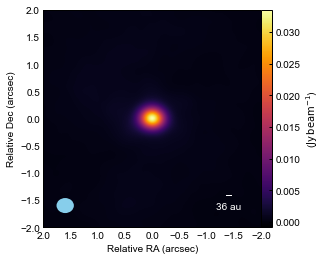

<Axes: xlabel='Relative RA (arcsec)', ylabel='Relative Dec (arcsec)'>

In [8]:
continuum.imview(fov=2, distance=360)

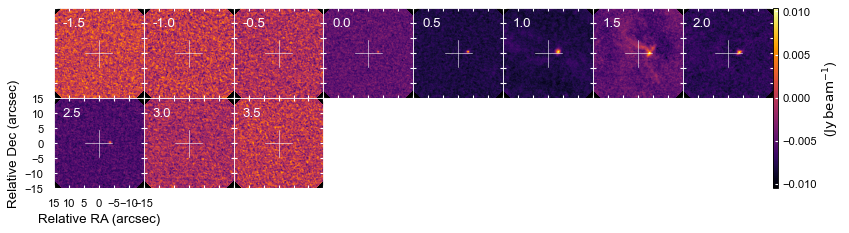

In [9]:
datacube.imview(ncol=8, nskip=5, decimals=1, dpi=80)  # you can increase the dpi for slower but higher quality plotting

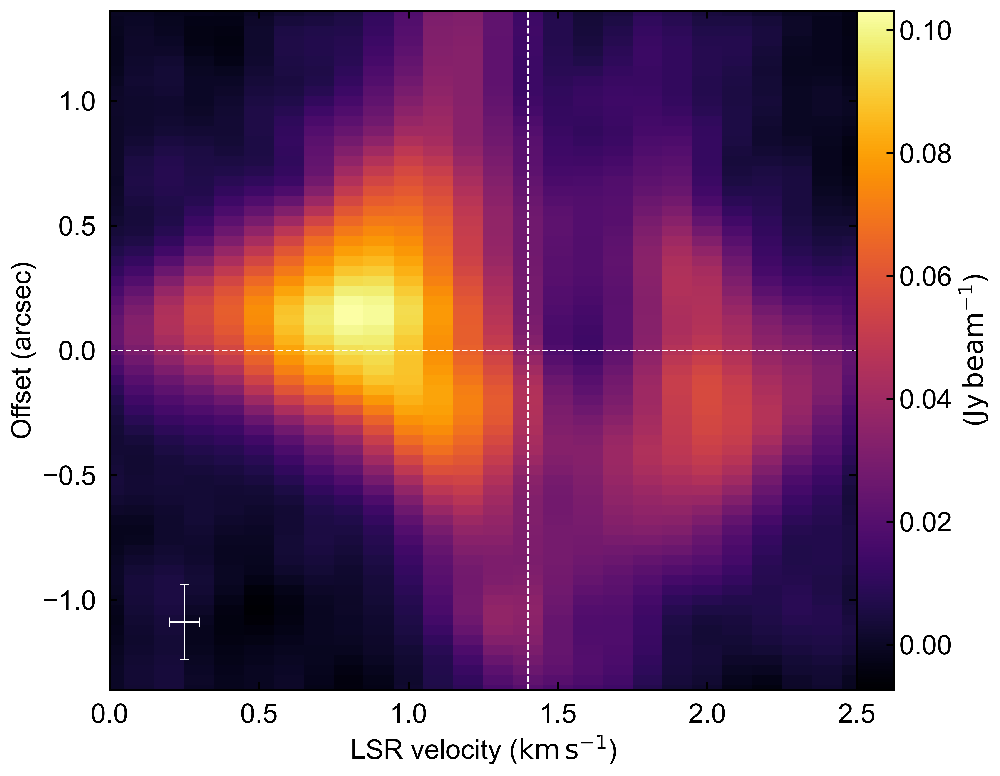

<Axes: xlabel='LSR velocity ($\\mathrm{km\\,s^{-1}}$)', ylabel='Offset (arcsec)'>

In [10]:
pv.imview(vsys=1.4, vlim=[0, 2.5])

# Making Moment Maps

Users can generate a list of Spatialmap instances, which are the specified moment maps, using the immoments task of data cubes.

In [11]:
mom0, mom1 = datacube.immoments(moments=(0, 1), threshold=3*datacube.noise())

/Users/ethanchou/Desktop/visualise_data_2/astroviz.py:1191: RuntimeWarning: invalid value encountered in divide
  momdata = np.nansum(data*vv, axis=1) / np.nansum(data, axis=1)


New center [J2000]: 05h55m38.20333334s +02d11m33.66s
Shifted to (-3.4, 0.36) [arcsec]


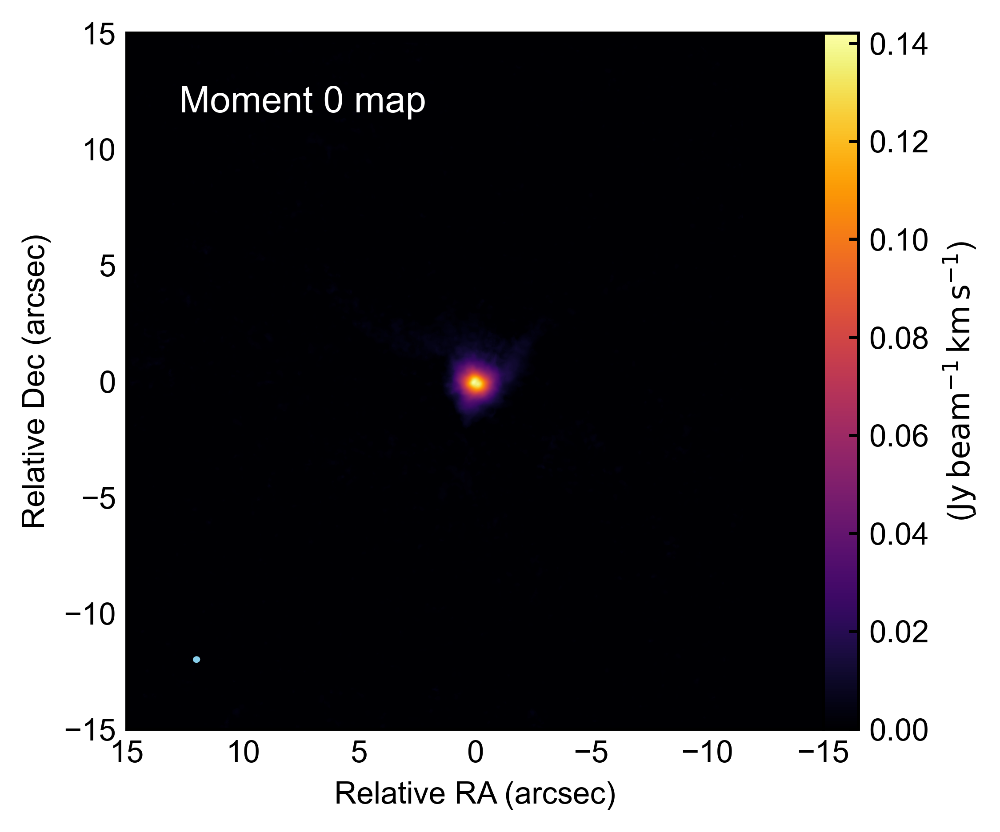

<Axes: xlabel='Relative RA (arcsec)', ylabel='Relative Dec (arcsec)'>

In [12]:
peakshifted_mom0 = mom0.peakshift()
peakshifted_mom0.imview(title="Moment 0 map")  # notice that the unit also changes!

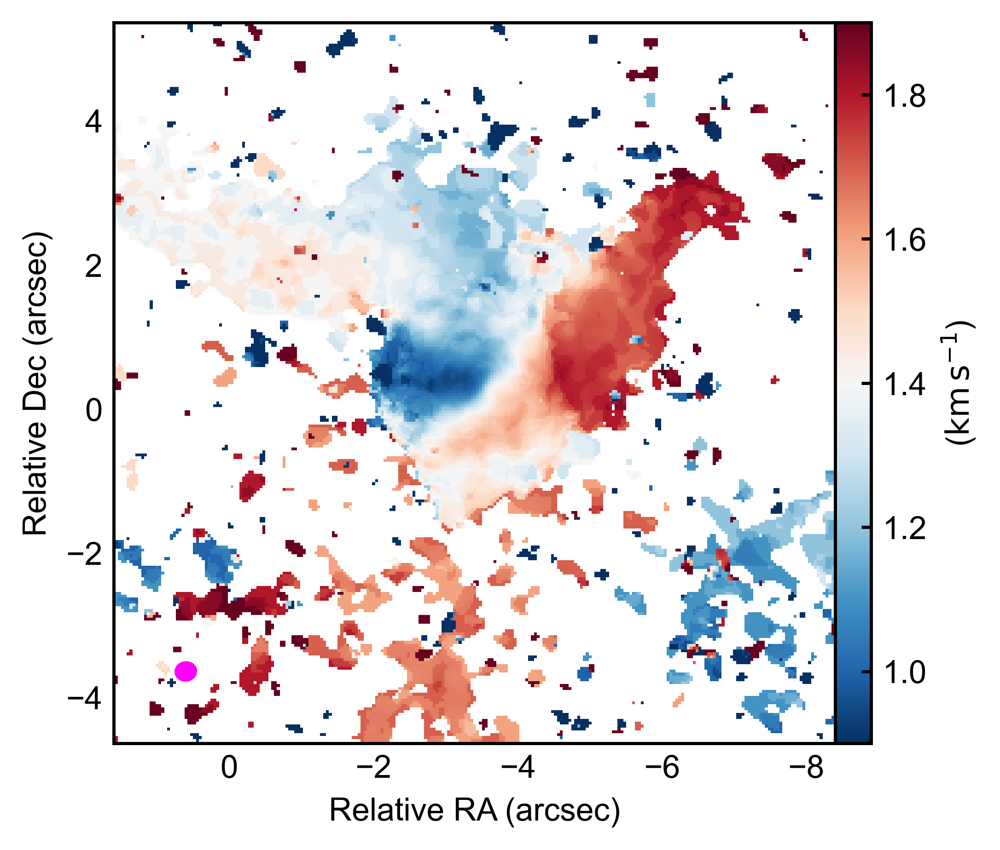

<Axes: xlabel='Relative RA (arcsec)', ylabel='Relative Dec (arcsec)'>

In [13]:
# if the unit is km/s, the color map is automatically set to blue and red.
mom1.imview(fov=5, 
            center=(-3.4, 0.36),
            vcenter=1.4, 
            vrange=1)

# Specifying regions

The 'Region' class allows users to import a region via its constructor, which can then be used in various methods of image objects. Users can also specify a DS9 directory to be imported. Here are some examples:

###############2D Gaussian Fitting Results###############
center: (-0.0032 +/- 0.0002, -0.0031 +/- 0.0001) [arcsec]
center (J2000): 5h55m38.197s 2d11m33.59s
amplitude: 0.0315 +/- 0.0000 [Jy/beam]
total flux: 76.6986 [Jy/beam]
FWHM: 0.4012 +/- 0.0004 x 0.3429 +/- 0.0004 [arcsec]
P.A.: -1.6650 +/- 0.2626 [deg]
#########################################################



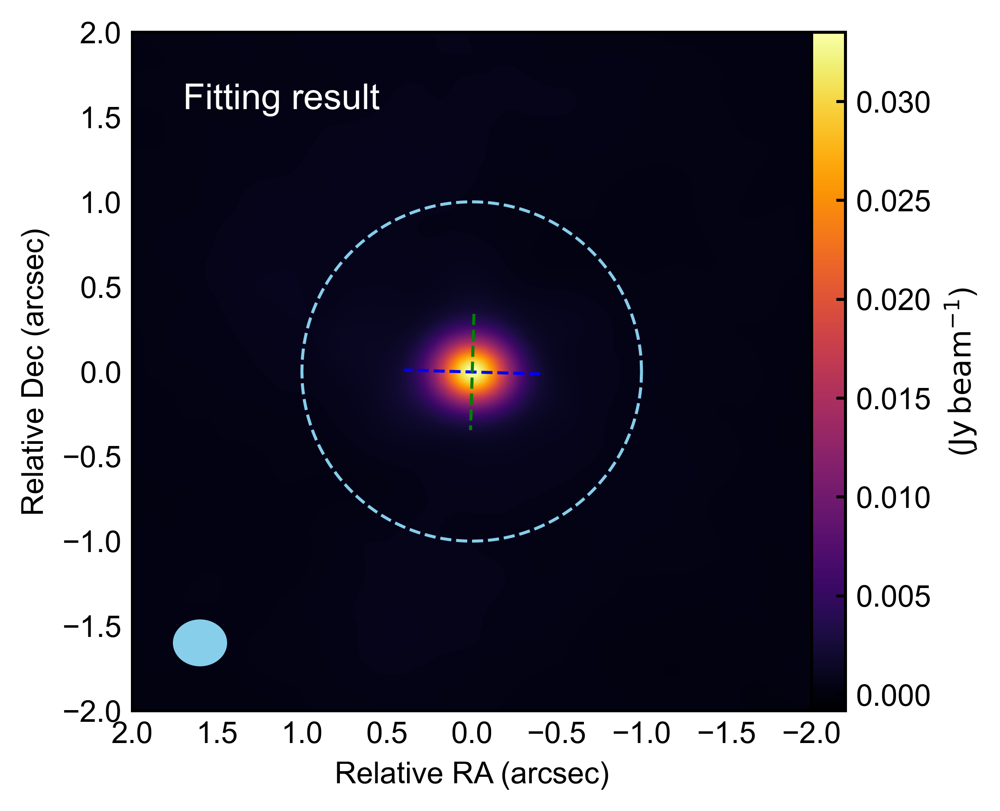

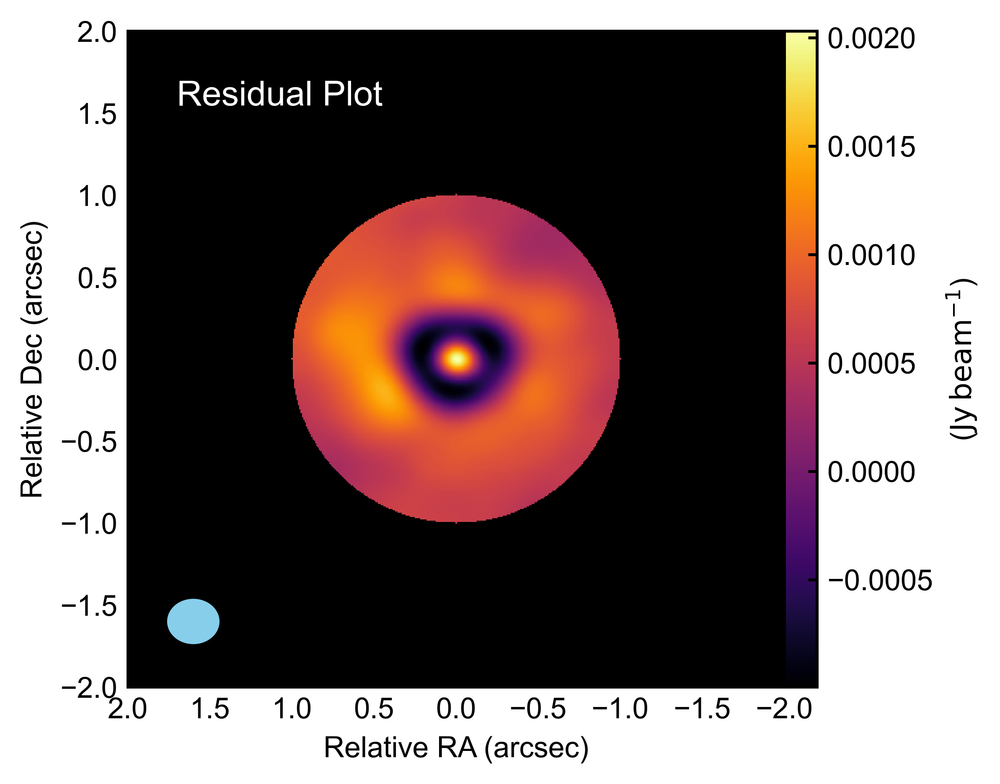

([-0.0031995662539752276,
  -0.003115807809079197,
  0.0314863251277662,
  0.4012372346549811,
  0.34290975475171903,
  -1.6650473854901156],
 [0.0001741969906849891,
  0.00014891440366236763,
  3.219381220851328e-05,
  0.00041024926718974484,
  0.0003506119846408914,
  0.26262585485637946],
 <astroviz.Spatialmap at 0x7fd9200ed8b0>)

In [14]:
# 'imfit' method of 'Spatialmap' objects:
circle = av.Region(center=(0, 0), radius=1)
continuum.imfit(circle, plt_residual=True)  

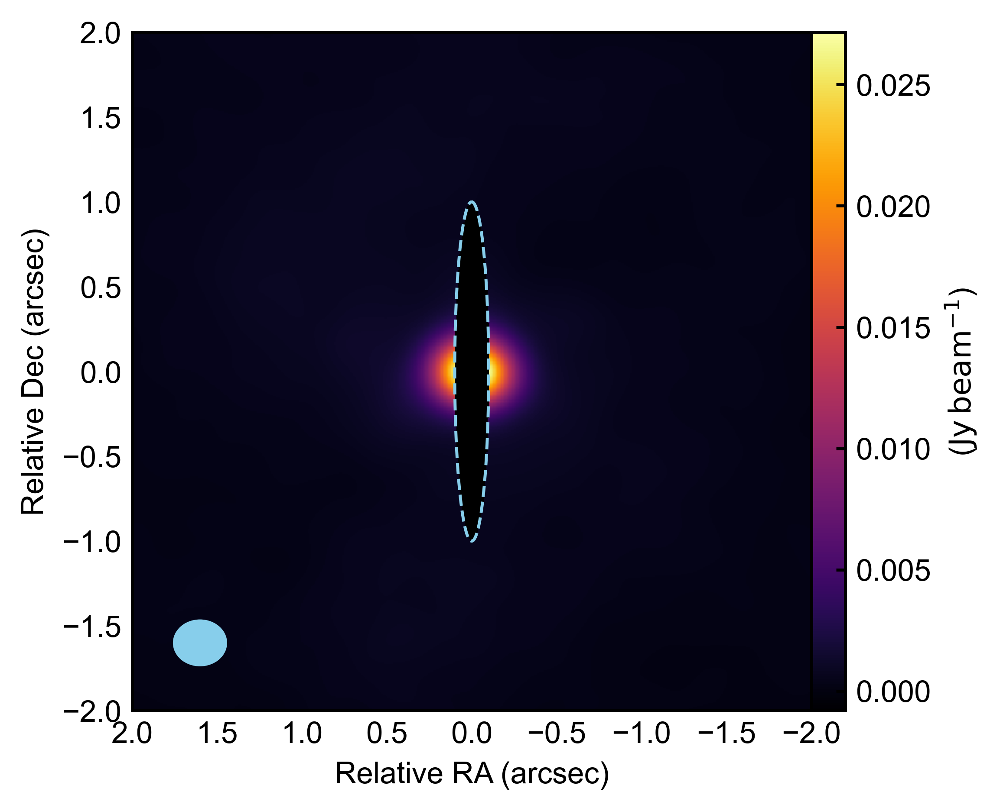

In [15]:
# 'mask_region' method of 'Spatial' objects (also works with 3D data cubes):
ellipse = av.Region(center=(0, 0), semimajor=1, semiminor=0.1)
continuum.mask_region(ellipse, 
                      exclude=True, # if exclude = True, region enclosed will be excluded. 
                      fov=2)

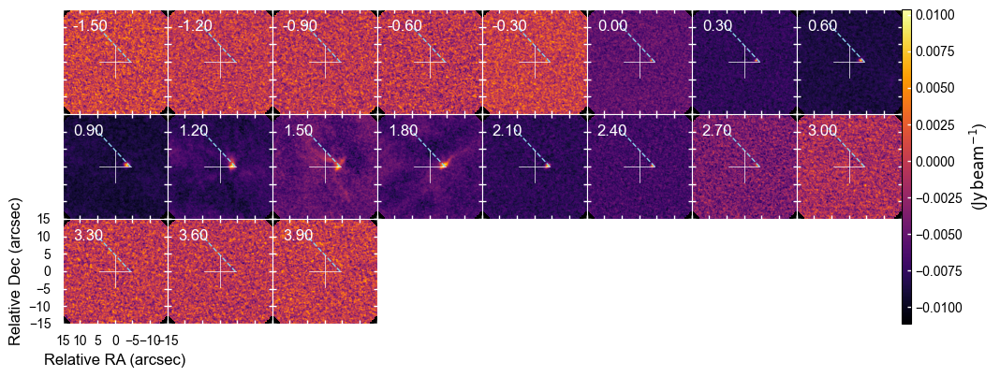

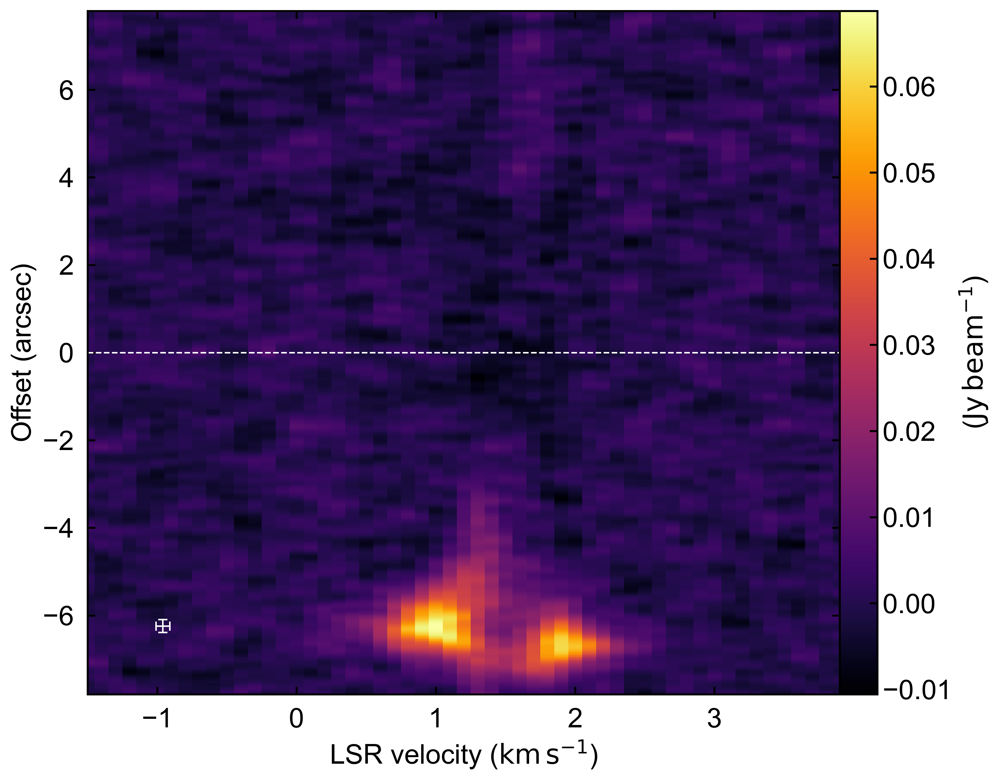

In [16]:
# Extracting PV diagrams from data cube using lines
line = av.Region("test_fitsfiles/line")  # supports reading of DS9 regions.
datacube.view_region(line, ncol=8, nskip=3, dpi=100)  # view the pv cut
extracted_pv = datacube.pvextractor(line)  # extract the pv diagram

In [18]:
# Regions also have headers!
line.header

{'shape': 'line',
 'start': (88.911762419, 2.195638968),
 'end': (88.908805171, 2.19247091),
 'center': (88.910283795, 2.194054939),
 'length': 0.004333809781805787,
 'pa': 43.02887272045674,
 'unit': 'deg',
 'relative': False}

# Unit conversion

Units can be converted using the 'conv_bunit' (for intensity), 'conv_unit' (for spatial axes), and 'conv_specunit' (for spectral axes). 

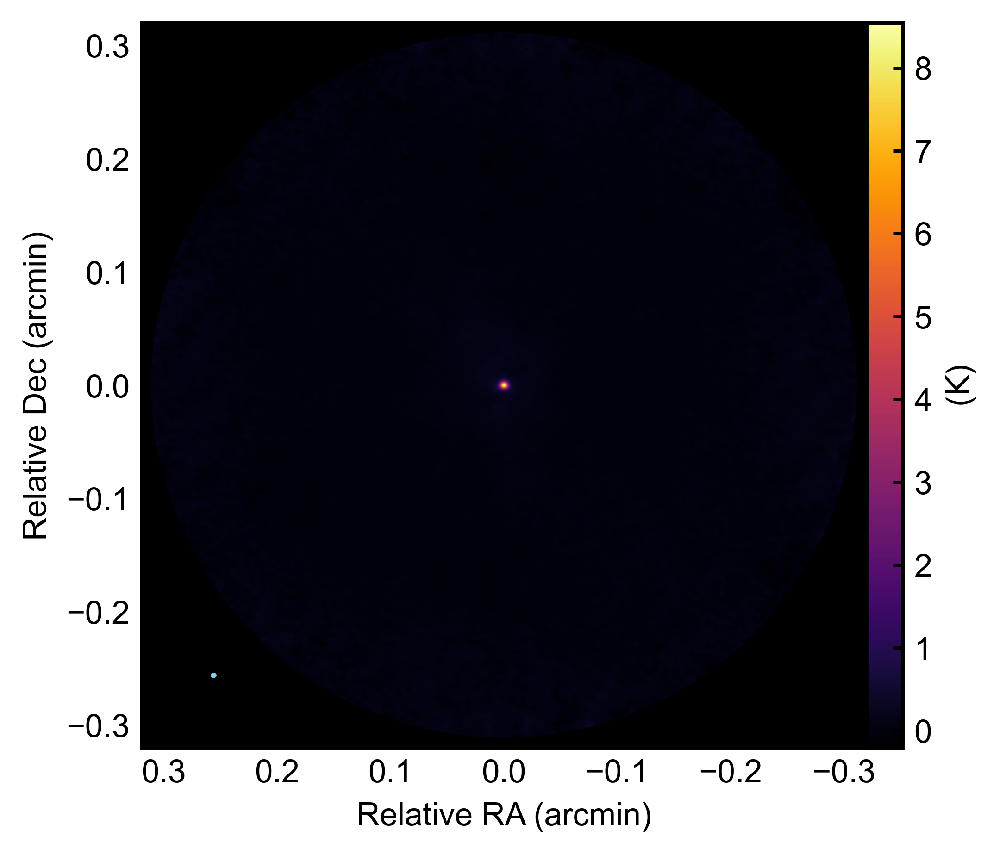

<Axes: xlabel='Relative RA (arcmin)', ylabel='Relative Dec (arcmin)'>

In [19]:
# convert intensity unit
continuum_bt = continuum.conv_bunit("K")  # equivalencies of brightness temperature/pixel/beam is supported!
# convert spatial unit
continuum_bt = continuum_bt.conv_unit("arcmin")

continuum_bt.imview()

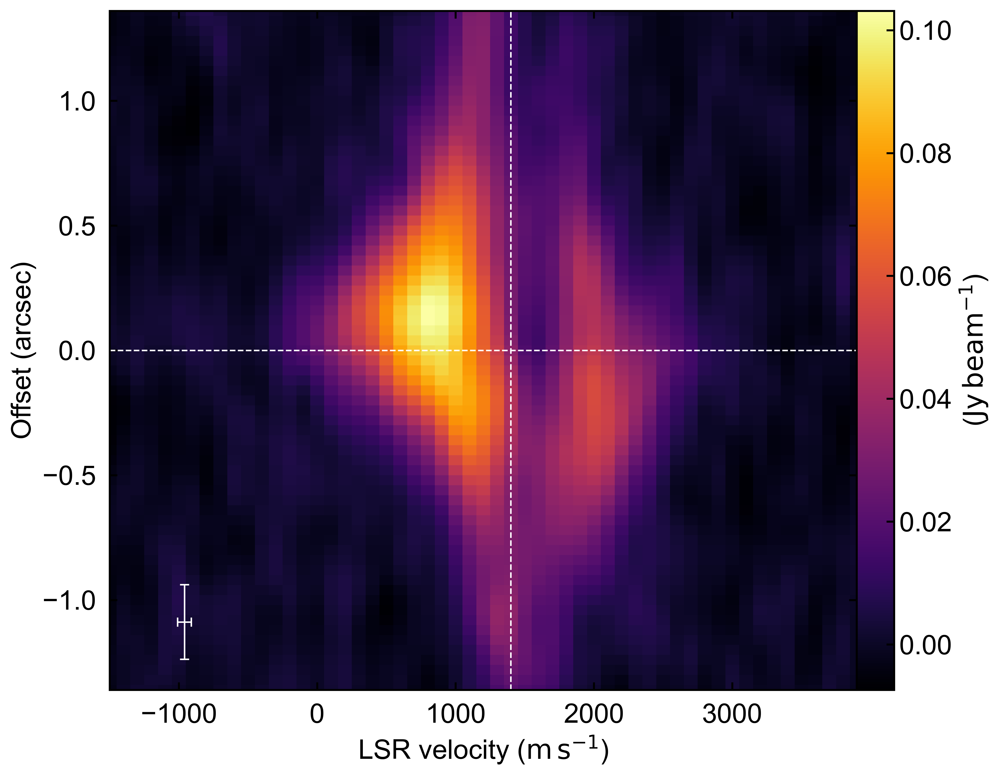

<Axes: xlabel='LSR velocity ($\\mathrm{m\\,s^{-1}}$)', ylabel='Offset (arcsec)'>

In [20]:
# conversion of spectral axis
pv_mps = pv.conv_specunit("m/s")
pv_mps.imview(vsys=1400)

# Manipulating images

Here are some methods for manipulating images. These work on Datacube and Spatialmap instances.

Convolving...


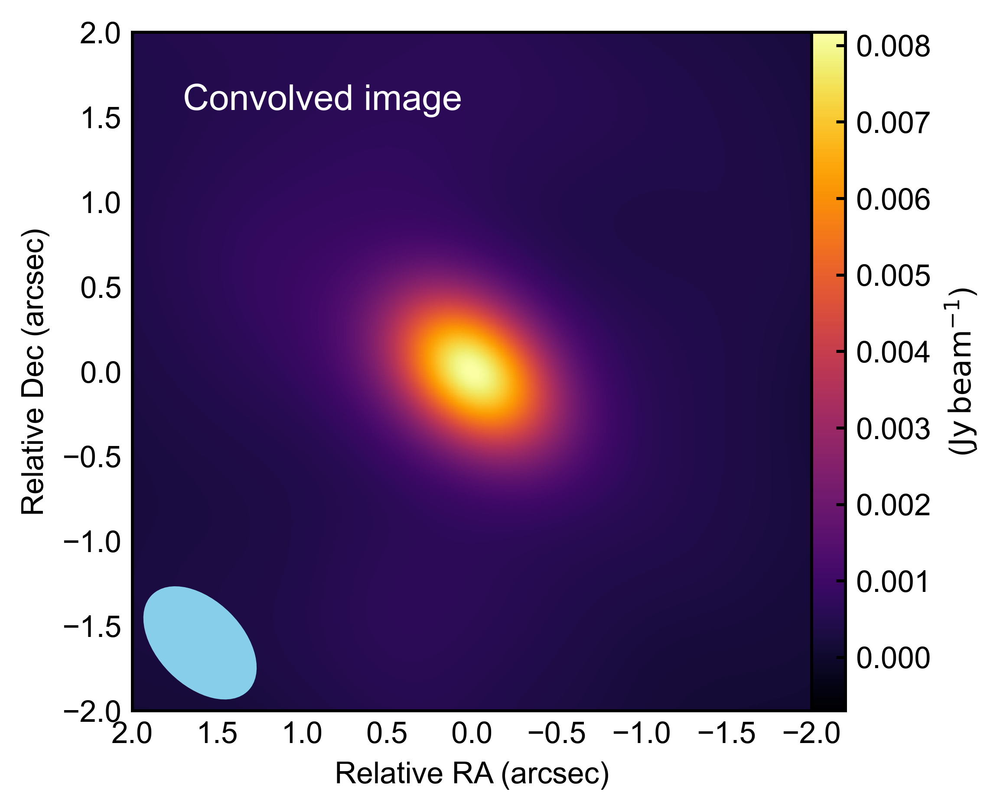

In [21]:
# Gaussian convolution
convolved_continuum = continuum.imsmooth(bmaj=0.8, bmin=0.5, bpa=45, fov=2)

New center [J2000]: 05h55m38.12555891s +02d11m37.35908836s


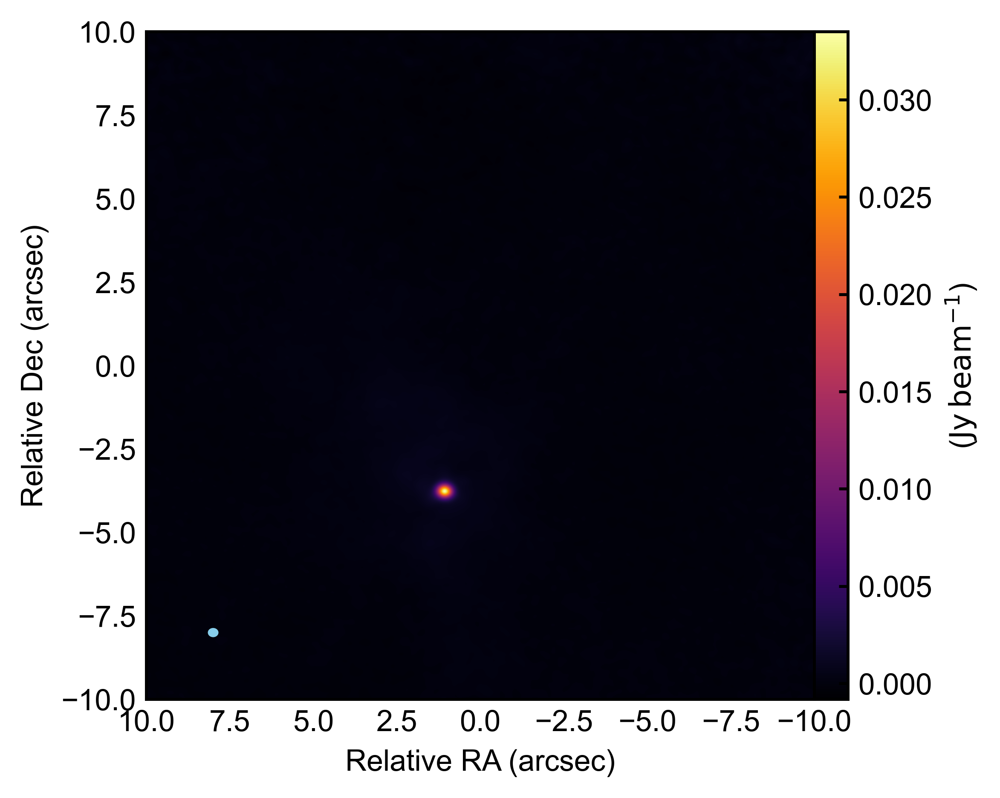

<Axes: xlabel='Relative RA (arcsec)', ylabel='Relative Dec (arcsec)'>

In [22]:
# Shifting images
shifted_continuum = continuum.imshift("5:55:38.1255589097 2:11:37.3590883560") # This coordinate is now (0, 0)
shifted_continuum.imview(fov=10)

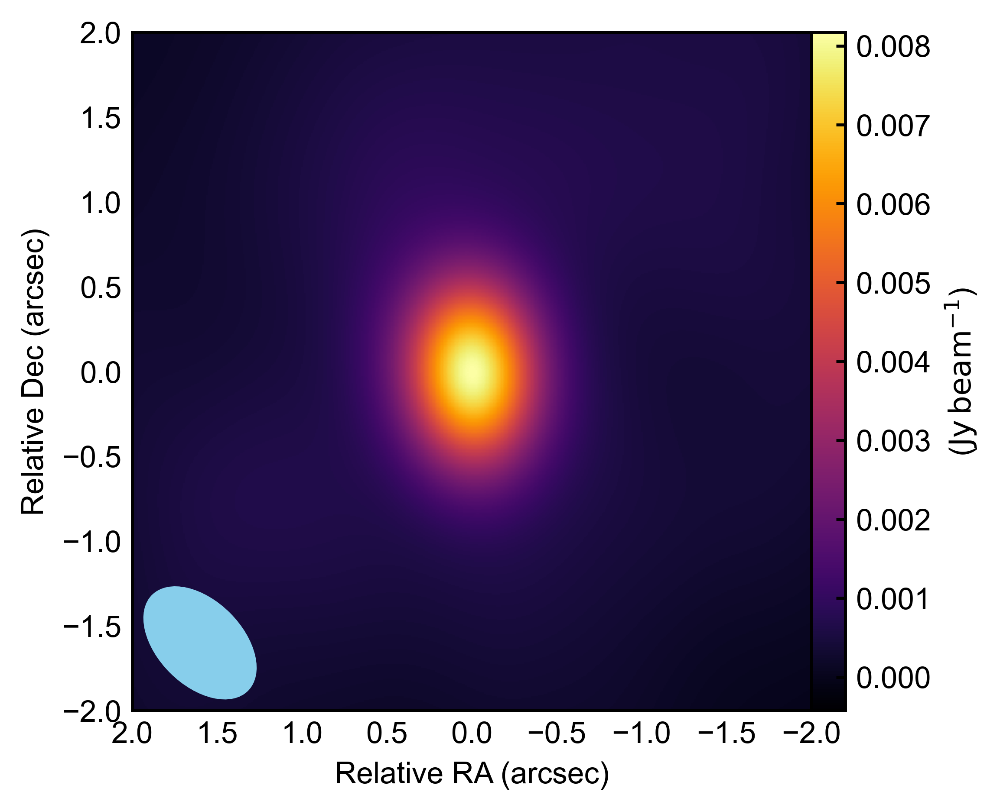

<Axes: xlabel='Relative RA (arcsec)', ylabel='Relative Dec (arcsec)'>

In [23]:
# rotating images
rotated_img = convolved_continuum.rotate(-45)
rotated_img.imview(fov=2)

Old imsize: (750, 750)
New center [J2000]: 05h55m38.20253334s +02d11m45.652s
Shifted to (-3.412, 12.352) [arcsec]
New imsize: (3745, 3745)


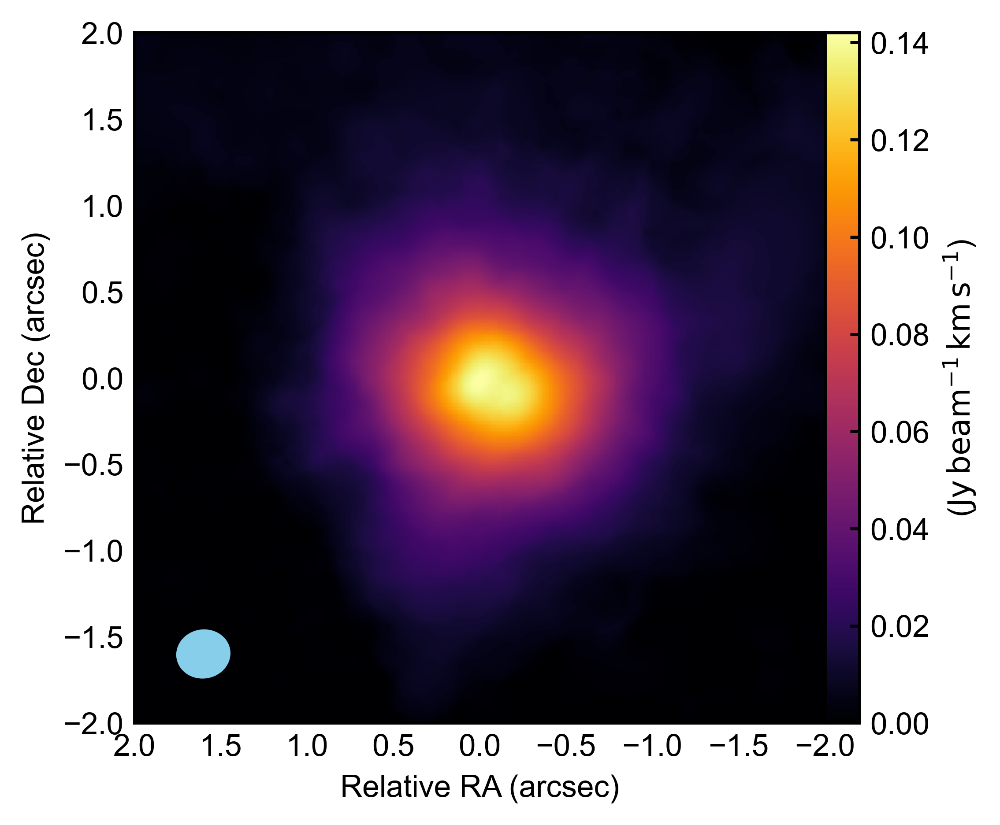

<Axes: xlabel='Relative RA (arcsec)', ylabel='Relative Dec (arcsec)'>

In [25]:
# regridding an image
print(f"Old imsize: {mom0.nx, mom0.ny}")
mom0_regrid = mom0.imregrid(continuum)  # using continuum as template, can also specify imsize, dx, and dy parameters.
mom0_regrid = mom0_regrid.peakshift()   # shift to peak position
print(f"New imsize: {mom0_regrid.nx, mom0_regrid.ny}")
mom0_regrid.imview(fov=2)

# Estimating noise

Noise can be estimated using the .noise() method of all image objects. Noise is estimated using iterative sigma clipping. The noise statistic is useful for many different purposes!.

###############Noise Statistics###############
Mean: -1.305980e-05 [Jy/beam]
RMS: 1.417843e-04 [Jy/beam]
StdDev: 1.411816e-04 [Jy/beam]
##############################################

###############Gaussian Fitting Results###############
Mean: -4.6471e-05 +/- 1.2338e-06 [Jy/beam]
StdDev: 1.1530e-04 +/- 1.2338e-06 [Jy/beam]
Amplitude: 72967.0 +/- 676.0 [pix]
######################################################



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


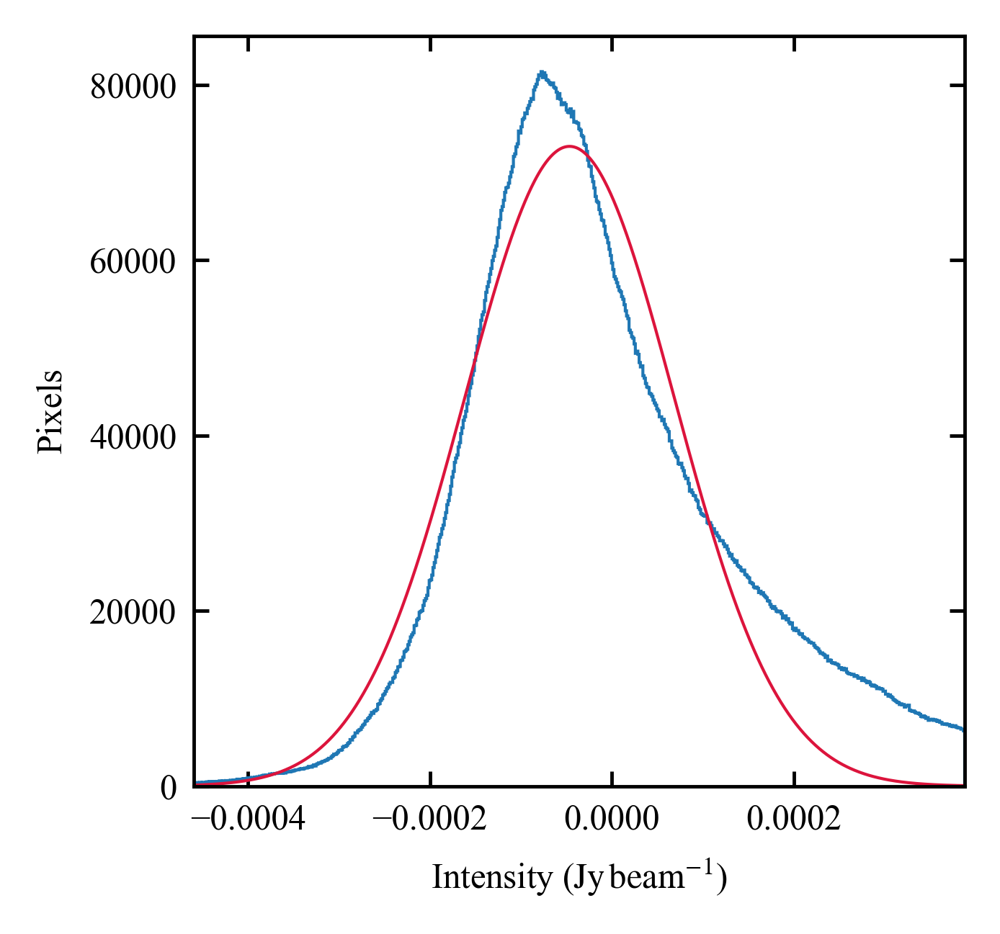

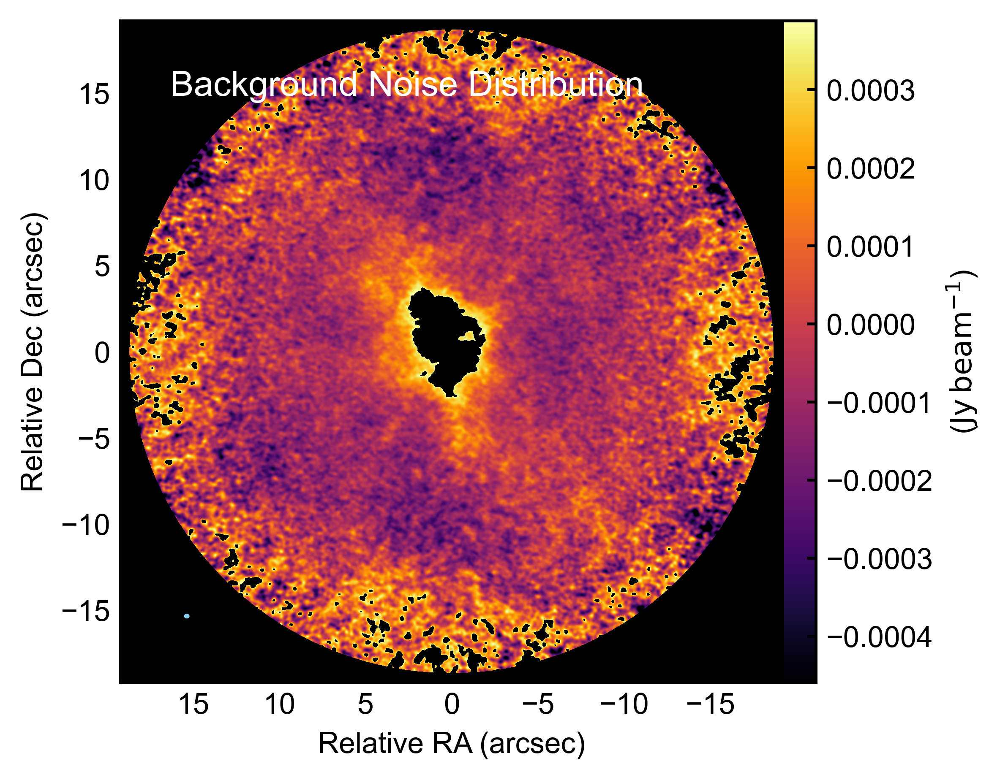

0.00014178430848387763

In [26]:
# The .noise() method returns the RMS noise level:
continuum.noise(printstats=True,  # print out noise statistics
                plthist=True,     # plot noise on a histogram
                shownoise=True,   # show noise distribution
                gaussfit=True,    # gaussian fitting on noise
                fixmean=False,    # don't fix mean of gaussian to 0.
               )

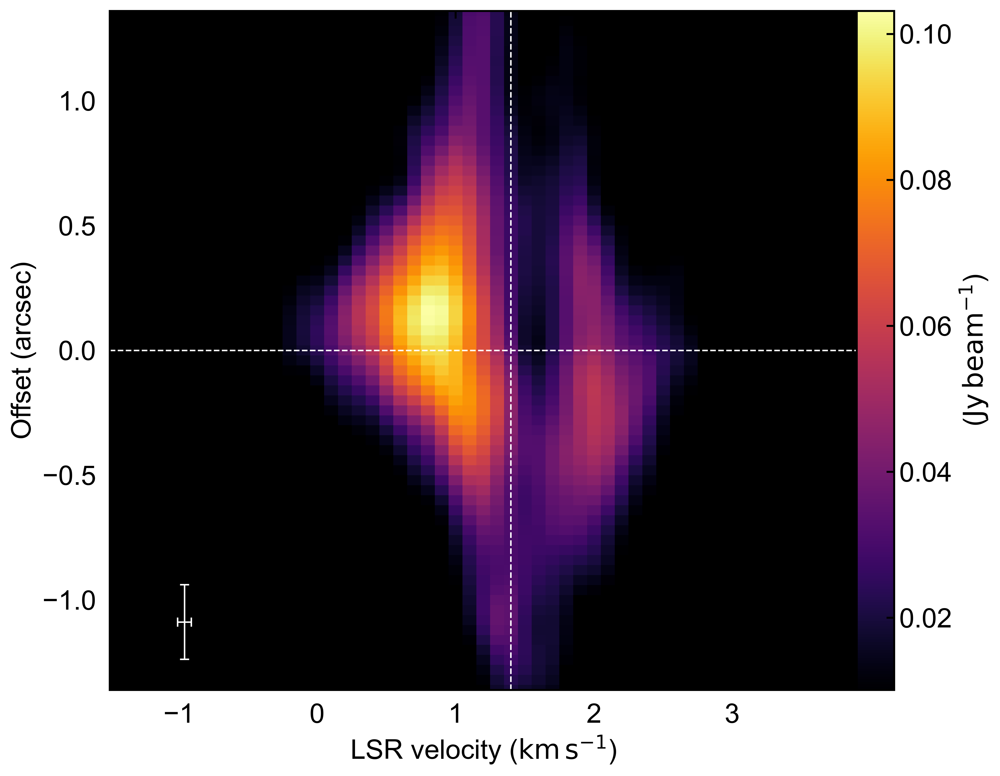

<Axes: xlabel='LSR velocity ($\\mathrm{km\\,s^{-1}}$)', ylabel='Offset (arcsec)'>

In [27]:
# set a threshold at three sigma is default
clean_pv = pv.set_threshold()
clean_pv.imview(vsys=1.4)

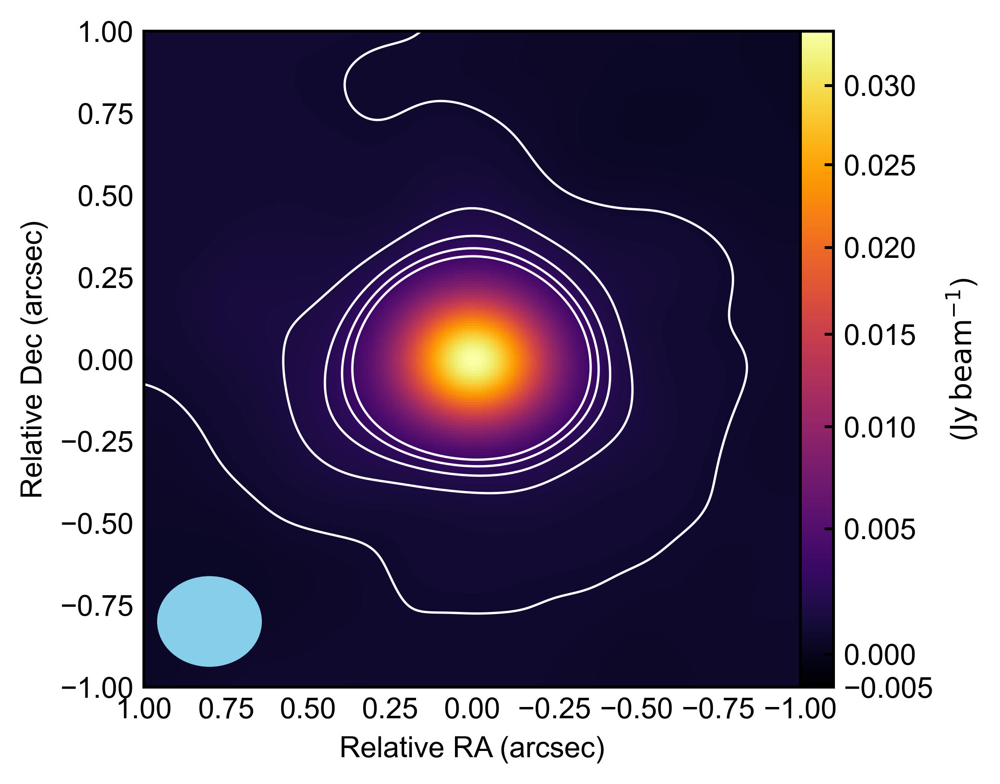

<Axes: xlabel='Relative RA (arcsec)', ylabel='Relative Dec (arcsec)'>

In [28]:
# plotting contour maps:
continuum.imview(continuum,
                 fov=1, 
                 crms=continuum.noise(),         # base contour level. Default (None) is also the noise estimated from contour map.
                 clevels=[5, 10, 15, 20, 25],    # relative contour levels
                 scale="gamma",                  # change color map to gamma scale
                 gamma=0.8
                 )

# Extracting spectral profiles from data cubes

/Users/ethanchou/Desktop/visualise_data_2/astroviz.py:1233: RuntimeWarning: All-NaN slice encountered
  momdata = np.nanmax(data, axis=1)


New center [J2000]: 05h55m38.20066668s +02d11m33.74s
Shifted to (-3.44, 0.44) [arcsec]


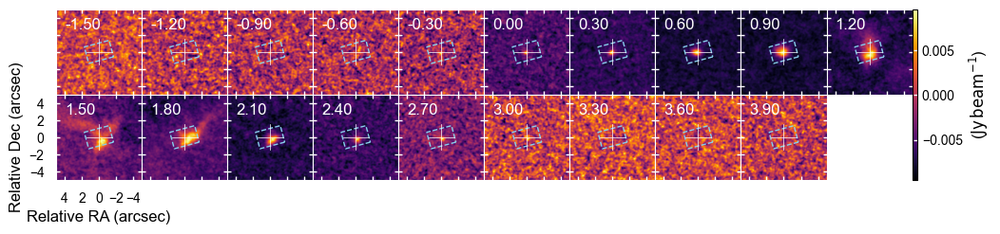

In [29]:
# create an aperture and see what it looks like on the map
aperture = av.Region(center=(0, 0), length=5, width=3, pa=15, shape="box")  # create a box
datacube_peakshifted = datacube.peakshift()  # shift peak position to center
datacube_peakshifted.view_region(aperture, dpi=100, fov=5, ncol=10, nskip=3)  # see what it looks like on the map

##########Fitting Results##########
Amplitude = 0.03 +/- 0.00
Mean = 1.27 +/- 0.03
FWHM = 1.44 +/- 0.07
###################################


<Axes: xlabel='Radio Velocity ($\\rm km~s^{-1}$)', ylabel='Intensity ($\\mathrm{Jy\\,beam^{-1}}$)'>

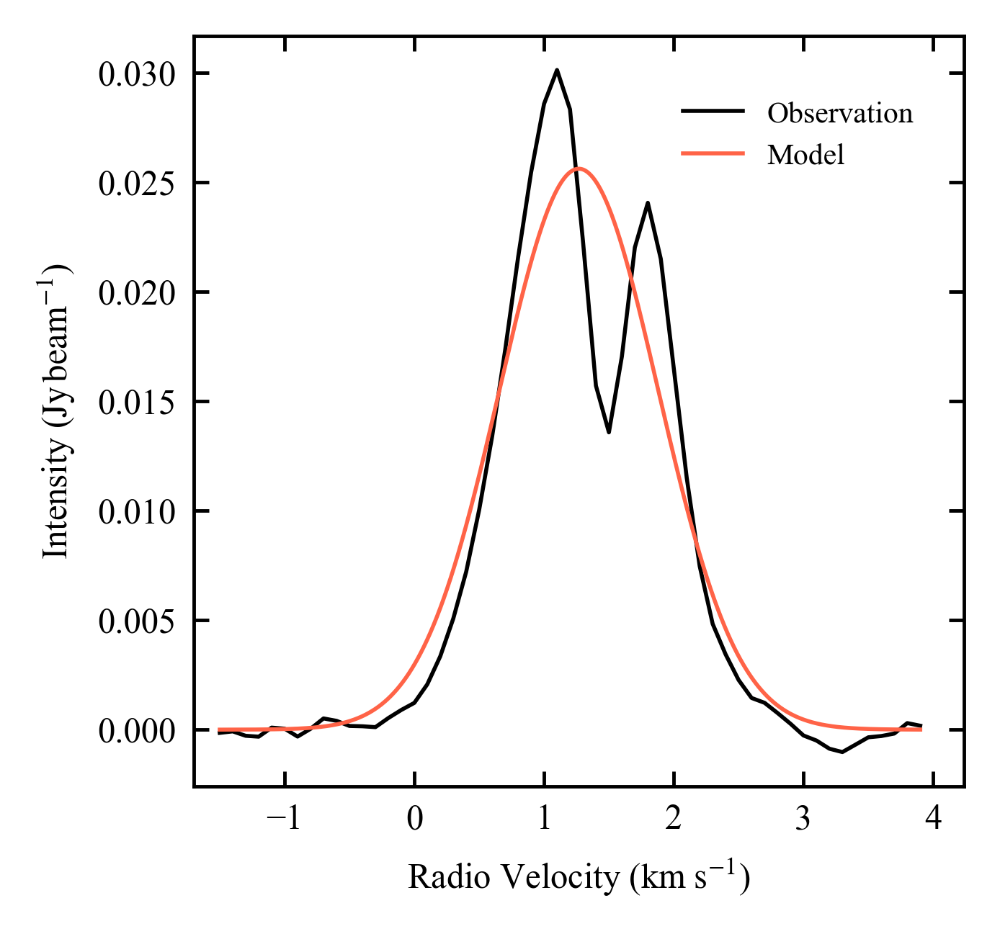

In [30]:
# extract spectrum
datacube_peakshifted.get_spectrum(aperture, gaussfit=True)  # if no aperture is specified, entire image is selected

# View molecular line information

Users can view the molecular line information using the .line_info() method, which searches for data from Splatalogue. Basically, it searches for the line with the closest rest frequnecy as the image.

In [31]:
mom0.line_info()

###############Line Information###############
Species ID: 245
Species: C18O
Chemical name: Carbon Monoxide
Frequency: 219.560358 +/- 1e-06 [GHz]
Resolved QNs: 2-1
Sij mu2: 0.02455 [Debye2]
Sij: 2.0
Einstein A coefficient (Aij): 6.049e-07 [1/s]
Lovas/AST intensity: 3.5
Lower energy level: 5.26877 [K]
Upper energy level: 15.80595 [K]
Upper state degeneracy (gu): 5.0
Rotational constants:
    B0 = 54891.42 [MHz]
Source: SLAIM
##############################################
Link to species data: https://splatalogue.online/species_metadata_displayer.php?species_id=245 



('C18O',
 'Carbon Monoxide',
 219.560358,
 1e-06,
 '2-1',
 0.0,
 0.02455,
 2.0,
 6.048810793359709e-07,
 3.5,
 5.26877,
 15.80595,
 5.0,
 (None, 54891.42, None),
 'SLAIM')

# Performing math operations

All image objects can be manipulated intuitively via built-in python operators.

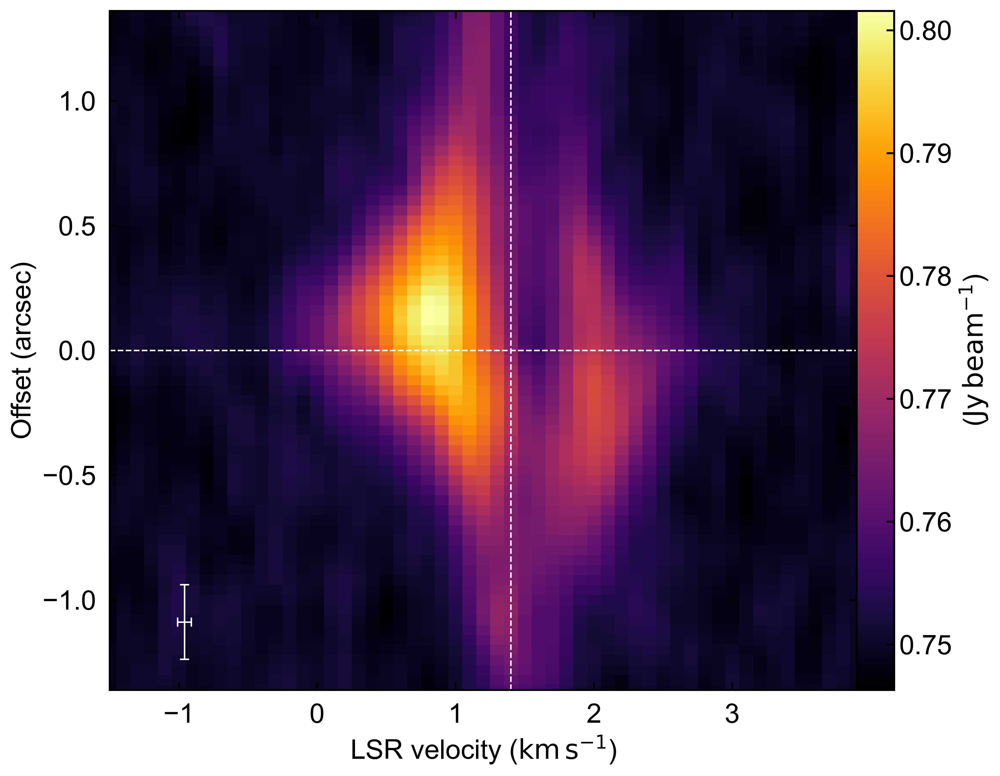

<Axes: xlabel='LSR velocity ($\\mathrm{km\\,s^{-1}}$)', ylabel='Offset (arcsec)'>

In [32]:
# plotting a pv diagram after multipling it by two:
manipulated_pv = (pv*2 + 3) / 4
manipulated_pv.imview(vsys=1.4)  # notice the intensity is now twice the value.

/Users/ethanchou/Desktop/visualise_data_2/astroviz.py:1233: RuntimeWarning: All-NaN slice encountered
  momdata = np.nanmax(data, axis=1)


New center [J2000]: 05h55m38.20333334s +02d11m33.66s
Shifted to (-3.4, 0.36) [arcsec]


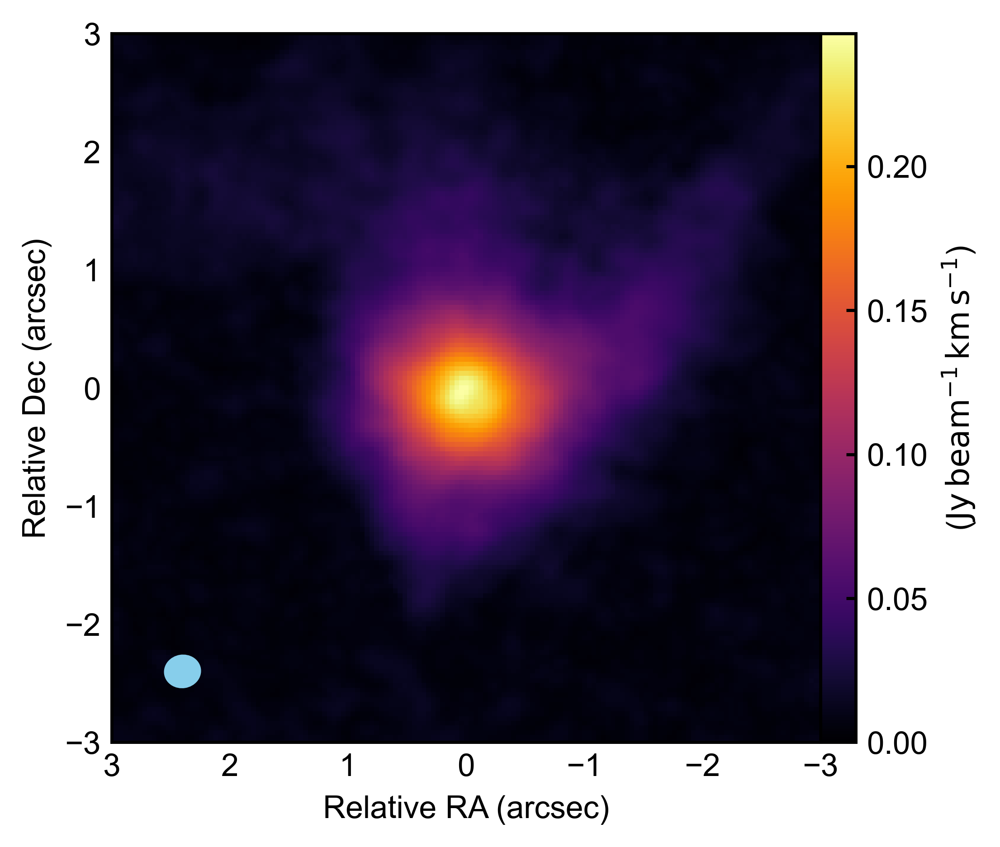

<Axes: xlabel='Relative RA (arcsec)', ylabel='Relative Dec (arcsec)'>

In [33]:
# works with two image objects!
mom8 = datacube.immoments(moments=8)
combined_image = mom0 + mom8
combined_image = combined_image.peakshift()
combined_image.imview(fov=3)

# Working with numpy arrays and astropy units

Image objects work with numpy functions!

In [34]:
print(np.nanmax(mom1[0, 0]))
print(np.nanargmin(mom1))
print(np.where(mom1>3))
print(np.round(mom1))

3.9000000000000004
379
(array([0, 0, 0, ..., 0, 0, 0]), array([0, 0, 0, ..., 0, 0, 0]), array([  0,   0,   0, ..., 749, 749, 749]), array([ 51,  52,  53, ..., 547, 548, 549]))
[[[[nan nan nan ... nan nan nan]
   [nan nan nan ... nan nan nan]
   [nan nan nan ... nan nan nan]
   ...
   [nan nan nan ... nan nan nan]
   [nan nan nan ... nan nan nan]
   [nan nan nan ... nan nan nan]]]]


Astropy units can be incorporated flawlessly!

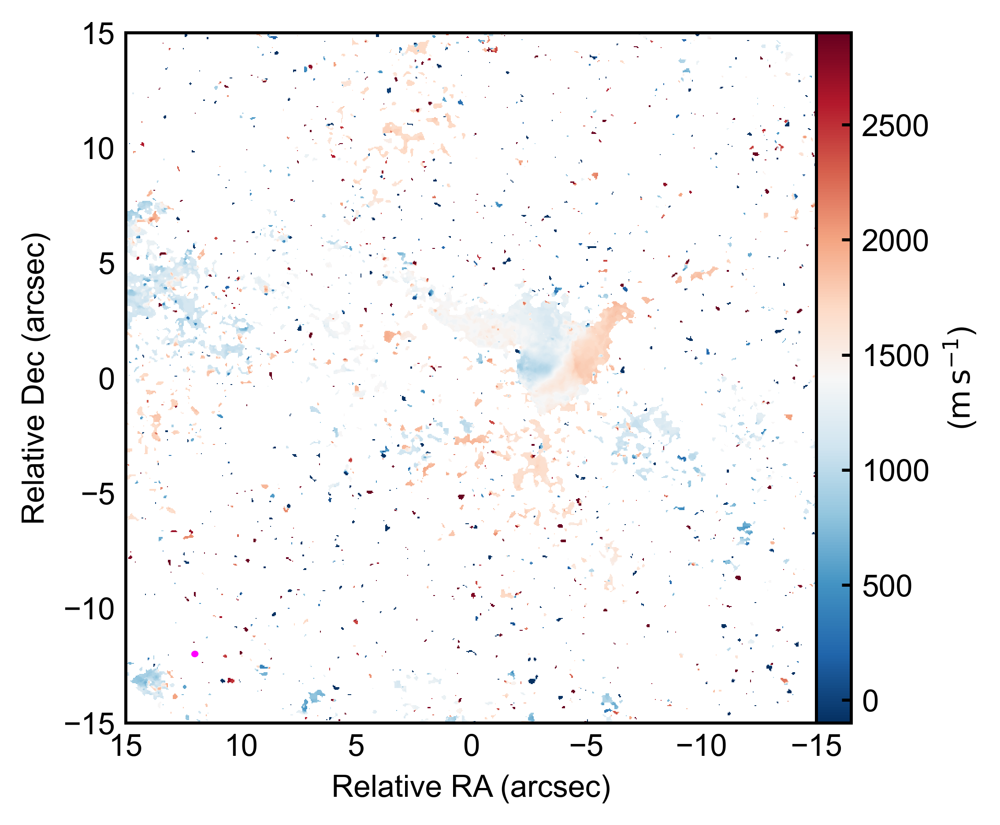

<Axes: xlabel='Relative RA (arcsec)', ylabel='Relative Dec (arcsec)'>

In [35]:
mom1_withunits = mom1*u.km/u.s  # note: assigning units leads to the original unit being overwritten
mom1_withunits = mom1_withunits.to(u.m/u.s)
mom1_withunits.imview(vcenter=1400, vrange=3000)

# Exporting into a FITS file

To export the image back into a FITS file, use the .exportfits() method:

In [36]:
mom8.exportfits("test_fitsfiles/moment8_image.fits", overwrite=True)

File saved as 'test_fitsfiles/moment8_image.fits'.
